<a href="https://colab.research.google.com/github/yachtsman/Coursera_Capstone/blob/master/IBM_Capstone_Project_v2_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Capstone Project - The Battle of the Neighborhoods (Week 2)
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

Toronto is the provincial capital of Ontario. It is the most populous city in Canada and the fourth most populous city in North America. Toronto has a large Italian Canadian community, with 32.2 percent of the ethnic Italians in Canada living in the Greater Toronto Area as of 2016. It is home to the fourth largest Italian population outside of Italy, behind São Paulo, Brazil, Buenos Aires, Argentina, and New York City, respectively. As of the Canada 2016 Census, there were more than 500k Italian Canadians located in the Greater Toronto Area.
There are many opportunities to open a new Italian restaurant.

The aim of this project is **to help a prospective investor to find the best location for the opening of a restaurant with Italian "homemade cuisine" for locals living in Toronto, Canada**.

We are going to investigate the best location in an area that meets the following criteria:

- A neighbourhood with average to above-average total population
- Above the average population of 25-50-year-old professionals
- Average to above-average median net household incomes
- Minimal competition around

The main objective is to provide the recommendation to the prospective investor which neighbourhood of Toronto will be the best choice to start in. We will analyze data of the population and focus on the borough and explore its neighborhoods which meets the criteria above. In addition, we'll take a look at the 10 most common venues in each neighbourhood where Italian restaurants are not among the most common venue.

## Data <a name="data"></a>



- To evaluate the neighbourhoods, we will be using the data from the 2016 Toronto Census
- Wikipedia, to matching each neighbourhood to their boroughs 
- Boundaries of City of Toronto Neighbourhoods to map the neighbourhoods
- Foursquare API to obtain information on venues/competitors.

We will be using the following data sources:

- The Census of Population in Toronto __[Open Data City of Toronto |  NEIGHBOURHOOD PROFILES](https://www.toronto.ca/city-government/data-research-maps/neighbourhoods-communities/neighbourhood-profiles/)__

  Data set:   __[neighbourhood-profiles-2016-csv](https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/ef0239b1-832b-4d0b-a1f3-4153e53b189e?format=csv)__ 

  The Census of Population is held across Canada every 5 years and collects data about age and sex, families and households, language, immigration and internal migration, ethnocultural diversity, Aboriginal peoples, housing, education, income, and labor. City of Toronto Neighbourhood Profiles use this Census data to provide a portrait of the demographic, social and economic characteristics of the people and households in each City of Toronto neighbourhood. The profiles present selected highlights from the data, but these accompanying data files provide the full data set assembled for each neighbourhood.
  - In these profiles, "neighbourhood" refers to the City of Toronto's 140 social planning neighbourhoods. These social planning neighbourhoods were developed by the City of Toronto to help government and community organizations with local planning by providing socio-economic data at a meaningful geographic area. The boundaries of these social planning neighbourhoods are consistent over time, allowing for comparison between Census years. Neighbourhood level data from a variety of other sources are also available through the City's Wellbeing Toronto mapping application and here on the Open Data portal.
  - Each data point in this file is presented for the City's 140 neighbourhoods, as well as for the City of Toronto as a whole. The data is sourced from a number of Census tables released by Statistics Canada. The general Census Profile is the main source table for this data, but other Census tables have also been used to provide additional information.

- Each of the 140 neighbourhoods of Toronto resides within a defined borough. We will obtain this information from Wikipedia:  __[Wikipedia | List of city-designated neighbourhoods in Toronto](https://en.wikipedia.org/wiki/List_of_city-designated_neighbourhoods_in_Toronto)__
   
- Boundaries of City of Toronto Neighbourhoods. __[Open Data City of Toronto |  NEIGHBOURHOOD](https://portal0.cf.opendata.inter.sandbox-toronto.ca/dataset/neighbourhoods/)__

  Data for mapping : 
  - __[Neighbourhoods GeoJSON File](https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/a083c865-6d60-4d1d-b6c6-b0c8a85f9c15?format=geojson&projection=4326)__
  - __[Neighbourhoods CSV File](https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/a083c865-6d60-4d1d-b6c6-b0c8a85f9c15?format=csv&projection=4326)__

- To collect information on other venues/competitors, we will use Foursquare: __[Foursquare | API](https://developer.foursquare.com/)__

## Methodology <a name="methodology"></a>

In this project, we will focus on finding neighbourhoods of Toronto to open an Italian restaurant with the "homemade cuisine" targeted on locals living nearby, that meet the initial criteria from the investor. We will limit our analysis to area ~2km around the centers of every neighbourhood.

In the first step, we will collect the required data from the Census of Population in Toronto, then scrap information about the Borough from Wikipedia and merging it with Boundaries of City of Toronto Neighbourhoods which includes the location of its centers. 

To establish the targeted neighbourhoods, we will examine the demographic data of the neighborhoods by segmenting the data and performing descriptive analysis using Panda.
So, the second step in our analysis will be the calculation of the scores of neighbourhoods according to initial criteria, selecting the top 20 of them, and the exploration of competitors across selected neighbourhoods using API Foursquare.

In the final step, we will focus on the most interesting areas to meet initial criteria and create clusters of locations that represent density and types of competitors.

In the end, we will present a map of the top 20 neighbourhoods indicating the competition and also create clusters (using k-means clustering) of those neighbourhoods to identify those of them with minimum competition around.

## Analysis <a name="analysis"></a>

### Getting the row data, cleaning

Importing dependencies

In [107]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json
from pandas.io.json import json_normalize

from geopy.geocoders import Nominatim
import requests
from bs4 import BeautifulSoup
import xml

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm

from sklearn.cluster import KMeans
import folium

print('Dependencies imported.')

Dependencies imported.


Downloading the Toronto Census data file and creating a dataframe

In [108]:
# City of Toronto Neighborhoods Profile Census CSV File

path = 'https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/ef0239b1-832b-4d0b-a1f3-4153e53b189e?format=csv'
df = pd.read_csv(path,encoding='latin1')
df.head()

,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,Banbury-Don Mills,Bathurst Manor,Bay Street Corridor,Bayview Village,Bayview Woods-Steeles,Bedford Park-Nortown,Beechborough-Greenbrook,Bendale,Birchcliffe-Cliffside,Black Creek,Blake-Jones,Briar Hill-Belgravia,Bridle Path-Sunnybrook-York Mills,Broadview North,Brookhaven-Amesbury,Cabbagetown-South St. James Town,Caledonia-Fairbank,Casa Loma,Centennial Scarborough,Church-Yonge Corridor,Clairlea-Birchmount,Clanton Park,Cliffcrest,Corso Italia-Davenport,Danforth,Danforth East York,Don Valley Village,Dorset Park,Dovercourt-Wallace Emerson-Junction,Downsview-Roding-CFB,Dufferin Grove,East End-Danforth,Edenbridge-Humber Valley,Eglinton East,Elms-Old Rexdale,Englemount-Lawrence,Eringate-Centennial-West Deane,Etobicoke West Mall,Flemingdon Park,Forest Hill North,Forest Hill South,Glenfield-Jane Heights,Greenwood-Coxwell,Guildwood,Henry Farm,High Park North,High Park-Swansea,Highland Creek,Hillcrest Village,Humber Heights-Westmount,Humber Summit,Humbermede,Humewood-Cedarvale,Ionview,Islington-City Centre West,Junction Area,Keelesdale-Eglinton West,Kennedy Park,Kensington-Chinatown,Kingsview Village-The Westway,Kingsway South,Lambton Baby Point,L'Amoreaux,Lansing-Westgate,Lawrence Park North,Lawrence Park South,Leaside-Bennington,Little Portugal,Long Branch,Malvern,Maple Leaf,Markland Wood,Milliken,Mimico (includes Humber Bay Shores),Morningside,Moss Park,Mount Dennis,Mount Olive-Silverstone-Jamestown,Mount Pleasant East,Mount Pleasant West,New Toronto,Newtonbrook East,Newtonbrook West,Niagara,North Riverdale,North St. James Town,Oakridge,Oakwood Village,O'Connor-Parkview,Old East York,Palmerston-Little Italy,Parkwoods-Donalda,Pelmo Park-Humberlea,Playter Estates-Danforth,Pleasant View,Princess-Rosethorn,Regent Park,Rexdale-Kipling,Rockcliffe-Smythe,Roncesvalles,Rosedale-Moore Park,Rouge,Runnymede-Bloor West Village,Rustic,Scarborough Village,South Parkdale,South Riverdale,St.Andrew-Windfields,Steeles,Stonegate-Queensway,Tam O'Shanter-Sullivan,Taylor-Massey,The Beaches,Thistletown-Beaumond Heights,Thorncliffe Park,Trinity-Bellwoods,University,Victoria Village,Waterfront Communities-The Island,West Hill,West Humber-Clairville,Westminster-Branson,Weston,Weston-Pelham Park,Wexford/Maryvale,Willowdale East,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,1,Neighbourhood Information,Neighbourhood Information,City of Toronto,Neighbourhood Number,NaN,129,128,20,95,42,34,76,52,49,39,112,127,122,24,69,108,41,57,30,71,109,96,133,75,120,33,123,92,66,59,47,126,93,26,83,62,9,138,5,32,11,13,44,102,101,25,65,140,53,88,87,134,48,8,21,22,106,125,14,90,110,124,78,6,15,114,117,38,105,103,56,84,19,132,29,12,130,17,135,73,115,2,99,104,18,50,36,82,68,74,121,107,54,58,80,45,23,67,46,10,72,4,111,86,98,131,89,28,139,85,70,40,116,16,118,61,63,3,55,81,79,43,77,136,1,35,113,91,119,51,37,7,137,64,60,94,100,97,27,31
1,2,Neighbourhood Information,Neighbourhood Information,City of Toronto,TSNS2020 Designation,NaN,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,NIA,No Designation,No Designation,NIA,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,Emerging Neighbourhood,No Designation,NIA,No Designation,No Designation,No Designation,NIA,NIA,Emerging Neighbourhood,No Designation,No Designation,NIA,No Designation,No Designation,NIA,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,No Designation,Emerging Neighbourhood,NIA,NIA,No Designation,NIA,No Designation,No Designation,NIA,NIA,No 

Getting a list of neighbourhoods in Toronto

In [109]:
neighbourhoods = list(df.columns.values)
neighbourhoods = neighbourhoods[6:]
print(neighbourhoods)

['Agincourt North', 'Agincourt South-Malvern West', 'Alderwood', 'Annex', 'Banbury-Don Mills', 'Bathurst Manor', 'Bay Street Corridor', 'Bayview Village', 'Bayview Woods-Steeles', 'Bedford Park-Nortown', 'Beechborough-Greenbrook', 'Bendale', 'Birchcliffe-Cliffside', 'Black Creek', 'Blake-Jones', 'Briar Hill-Belgravia', 'Bridle Path-Sunnybrook-York Mills', 'Broadview North', 'Brookhaven-Amesbury', 'Cabbagetown-South St. James Town', 'Caledonia-Fairbank', 'Casa Loma', 'Centennial Scarborough', 'Church-Yonge Corridor', 'Clairlea-Birchmount', 'Clanton Park', 'Cliffcrest', 'Corso Italia-Davenport', 'Danforth', 'Danforth East York', 'Don Valley Village', 'Dorset Park', 'Dovercourt-Wallace Emerson-Junction', 'Downsview-Roding-CFB', 'Dufferin Grove', 'East End-Danforth', 'Edenbridge-Humber Valley', 'Eglinton East', 'Elms-Old Rexdale', 'Englemount-Lawrence', 'Eringate-Centennial-West Deane', 'Etobicoke West Mall', 'Flemingdon Park', 'Forest Hill North', 'Forest Hill South', 'Glenfield-Jane Heig

Creating dataframe with target population according to criteria

In [110]:
# Gettiing & transposing the necessary data according to criteria
# population = Population, 2016 - 3
# xy1 = Male: 25 to 29 years - 21
# xy2 = Male: 30 to 34 years - 22
# xy3 = Male: 35 to 39 years - 23
# xy4 = Male: 40 to 44 years - 24
# xy5 = Male: 45 to 49 years - 25
# xx1 = Female: 25 to 29 years - 42
# xx2 = Female: 30 to 34 years - 43
# xx3 = Female: 35 to 39 years - 44
# xx4 = Female: 40 to 44 years - 45
# xx5 = Female: 45 to 49 years - 46
# after_tax_income =   After-tax income: Average amount ($) - 2355
toronto_tp = pd.DataFrame(index=neighbourhoods, columns=["CDN1", "population", "target_population", "after_tax_income"])

for index, row in toronto_tp.iterrows():
    toronto_tp.at[index, 'CDN1'] = df[index][0]
    toronto_tp.at[index, 'population'] = df[index][3]
    toronto_tp.at[index, 'xy1'] = df[index][21]
    toronto_tp.at[index, 'xy2'] = df[index][22]
    toronto_tp.at[index, 'xy3'] = df[index][23]
    toronto_tp.at[index, 'xy4'] = df[index][24]
    toronto_tp.at[index, 'xy5'] = df[index][25]
    toronto_tp.at[index, 'xx1'] = df[index][42]
    toronto_tp.at[index, 'xx2'] = df[index][43]
    toronto_tp.at[index, 'xx3'] = df[index][44]
    toronto_tp.at[index, 'xx4'] = df[index][45]
    toronto_tp.at[index, 'xx5'] = df[index][46]
    toronto_tp.at[index, 'after_tax_income'] = df[index][2355]
toronto_tp.reset_index(inplace=True)
toronto_tp.head()

,index,CDN1,population,target_population,after_tax_income,xy1,xy2,xy3,xy4,xy5,xx1,xx2,xx3,xx4,xx5
0,Agincourt North,129,"30,279",NaN,"633,574",835,680,760,890,1160,935,775,910,1060,1290
1,Agincourt South-Malvern West,128,"21,988",NaN,"540,969",820,625,610,760,970,835,715,745,885,975
2,Alderwood,20,"11,904",NaN,"388,460",410,455,420,440,515,430,450,445,430,515
3,Annex,95,"29,177",NaN,"2,053,142",1610,1055,835,850,920,1675,1040,915,855,935
4,Banbury-Don Mills,42,"26,918",NaN,"1,158,599",735,735,815,1010,1110,860,895,975,1170,1115


In [111]:
toronto_tp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140 entries, 0 to 139
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   index              140 non-null    object
 1   CDN1               140 non-null    object
 2   population         140 non-null    object
 3   target_population  0 non-null      object
 4   after_tax_income   140 non-null    object
 5   xy1                140 non-null    object
 6   xy2                140 non-null    object
 7   xy3                140 non-null    object
 8   xy4                140 non-null    object
 9   xy5                140 non-null    object
 10  xx1                140 non-null    object
 11  xx2                140 non-null    object
 12  xx3                140 non-null    object
 13  xx4                140 non-null    object
 14  xx5                140 non-null    object
dtypes: object(15)
memory usage: 16.5+ KB


Cleaning data & Summarizing the target population

In [112]:
toronto_tp.columns = toronto_tp.columns.str.replace('index', 'neighbourhood')
toronto_tp['population'] = toronto_tp['population'].str.replace(',','').astype(int)
toronto_tp['after_tax_income'] = toronto_tp['after_tax_income'].str.replace(',','').astype(int)
toronto_tp.loc[:, 'xy1':'xx5'] = toronto_tp.loc[:, 'xy1':'xx5'].astype(int)
toronto_tp['target_population'] = toronto_tp.loc[:, 'xy1':'xx5'].sum(axis=1)
toronto_tp.drop(columns=['xy1',	'xy2',	'xy3',	'xy4',	'xy5',	'xx1',	'xx2',	'xx3',	'xx4',	'xx5'], axis=1, inplace=True)

toronto_tp.head()

,neighbourhood,CDN1,population,target_population,after_tax_income
0,Agincourt North,129,30279,9295,633574
1,Agincourt South-Malvern West,128,21988,7940,540969
2,Alderwood,20,11904,4510,388460
3,Annex,95,29177,10690,2053142
4,Banbury-Don Mills,42,26918,9420,1158599


Scraping data from Wikipedia

In [113]:
wiki_url = requests.get('https://en.wikipedia.org/wiki/List_of_city-designated_neighbourhoods_in_Toronto').text
soup = BeautifulSoup(wiki_url,'lxml')
wiki_table = soup.find('table',{'class':'wikitable sortable'})
wiki_rows = wiki_table.find_all('tr')
print('soup cooked, rows founded')

soup cooked, rows founded


In [114]:
data = []
for row in wiki_rows:
    data.append([t.text.strip()
    for t in row.find_all('td')]
    )
df_wiki = pd.DataFrame(data, columns=['CDN', 'Neighbourhood_w', 'Borough', 'Neighbourhood2', 'Map', '000'])
df_wiki.drop([0], inplace=True) # to skip first rows 'none'
df_wiki.drop(['Neighbourhood2', 'Map', '000'], axis=1, inplace=True) # to skip unnecessary columns 

print(df_wiki.shape)
df_wiki.head()

(140, 3)


,CDN,Neighbourhood_w,Borough
1,129,Agincourt North,Scarborough
2,128,Agincourt South-Malvern West,Scarborough
3,20,Alderwood,Etobicoke
4,95,Annex,Old City of Toronto
5,42,Banbury-Don Mills,North York


In [115]:
df_wiki.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 140 entries, 1 to 140
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   CDN              140 non-null    object
 1   Neighbourhood_w  140 non-null    object
 2   Borough          140 non-null    object
dtypes: object(3)
memory usage: 4.4+ KB


Adding the Borough to the Target population

In [116]:
df_tp = pd.merge(df_wiki, toronto_tp, left_on='CDN', right_on='CDN1', how='inner')
df_tp.drop(['Neighbourhood_w', 'CDN1'], axis=1, inplace=True)
print(df_tp.shape)
df_tp.head()

(140, 6)


,CDN,Borough,neighbourhood,population,target_population,after_tax_income
0,129,Scarborough,Agincourt North,30279,9295,633574
1,128,Scarborough,Agincourt South-Malvern West,21988,7940,540969
2,20,Etobicoke,Alderwood,11904,4510,388460
3,95,Old City of Toronto,Annex,29177,10690,2053142
4,42,North York,Banbury-Don Mills,26918,9420,1158599


Downloading Boundaries of City of Toronto Neighbourhoods

In [117]:
path_b = 'https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/a083c865-6d60-4d1d-b6c6-b0c8a85f9c15?format=csv&projection=4326'
df_b = pd.read_csv(path_b)
df_b.head()

,_id,AREA_ID,AREA_ATTR_ID,PARENT_AREA_ID,AREA_SHORT_CODE,AREA_LONG_CODE,AREA_NAME,AREA_DESC,X,Y,LONGITUDE,LATITUDE,OBJECTID,Shape__Area,Shape__Length,geometry
0,6581,25886861,25926662,49885,94,94,Wychwood (94),Wychwood (94),NaN,NaN,-79.425515,43.676919,16491505,3.217960e+06,7515.779658,"{u'type': u'Polygon', u'coordinates': (((-79.4..."
1,6582,25886820,25926663,49885,100,100,Yonge-Eglinton (100),Yonge-Eglinton (100),NaN,NaN,-79.403590,43.704689,16491521,3.160334e+06,7872.021074,"{u'type': u'Polygon', u'coordinates': (((-79.4..."
2,6583,25886834,25926664,49885,97,97,Yonge-St.Clair (97),Yonge-St.Clair (97),NaN,NaN,-79.397871,43.687859,16491537,2.222464e+06,8130.411276,"{u'type': u'Polygon', u'coordinates': (((-79.3..."
3,6584,25886593,25926665,49885,27,27,York University Heights (27),York University Heights (27),NaN,NaN,-79.488883,43.765736,16491553,2.541821e+07,25632.335242,"{u'type': u'Polygon', u'coordinates': (((-79.5..."
4,6585,25886688,25926666,49885,31,31,Yorkdale-Glen Park (31),Yorkdale-Glen Park (31),NaN,NaN,-79.457108,43.714672,16491569,1.156669e+07,13953.408098,"{u'type': u'Polygon', u'coordinates': (((-79.4..."


Wrangling data

In [118]:
df_b = df_b.loc[:, ['AREA_SHORT_CODE', 'AREA_NAME','LONGITUDE','LATITUDE']]
# we need AREA_NAME for creating a map in the following steps
df_b['AREA_SHORT_CODE'] = df_b['AREA_SHORT_CODE'].astype(str)
df_b.head()

,AREA_SHORT_CODE,AREA_NAME,LONGITUDE,LATITUDE
0,94,Wychwood (94),-79.425515,43.676919
1,100,Yonge-Eglinton (100),-79.403590,43.704689
2,97,Yonge-St.Clair (97),-79.397871,43.687859
3,27,York University Heights (27),-79.488883,43.765736
4,31,Yorkdale-Glen Park (31),-79.457108,43.714672


In [119]:
df_b.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140 entries, 0 to 139
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   AREA_SHORT_CODE  140 non-null    object 
 1   AREA_NAME        140 non-null    object 
 2   LONGITUDE        140 non-null    float64
 3   LATITUDE         140 non-null    float64
dtypes: float64(2), object(2)
memory usage: 4.5+ KB


Getting final working dataframe

In [120]:
df_fin = pd.merge(df_tp, df_b, left_on='CDN', right_on='AREA_SHORT_CODE', how='inner')
df_fin.drop(['AREA_SHORT_CODE'], axis=1, inplace=True)
df_fin.head()

,CDN,Borough,neighbourhood,population,target_population,after_tax_income,AREA_NAME,LONGITUDE,LATITUDE
0,129,Scarborough,Agincourt North,30279,9295,633574,Agincourt North (129),-79.266712,43.805441
1,128,Scarborough,Agincourt South-Malvern West,21988,7940,540969,Agincourt South-Malvern West (128),-79.265612,43.788658
2,20,Etobicoke,Alderwood,11904,4510,388460,Alderwood (20),-79.541611,43.604937
3,95,Old City of Toronto,Annex,29177,10690,2053142,Annex (95),-79.404001,43.671585
4,42,North York,Banbury-Don Mills,26918,9420,1158599,Banbury-Don Mills (42),-79.349718,43.737657


### Calculating Scores according to criteria

In [121]:
# Getting the medians

p_med = df_fin['population'].median()
tp_med = df_fin['target_population'].median()
income_med = df_fin['after_tax_income'].median()

#Creating the Scoring df

df_score = pd.DataFrame(columns=["CDN_score", "p_score", "tp_score", "income_score", "total_score"])
df_score["CDN_score"] = df_fin["CDN"]

# Calculationg the Scores
# For the scoring system, we add a coefficient of importance for each criterion
# The actual figures were obtained as a result of consultations with several restaurateurs in Kyiv, Ukraine.

p_score = [] # 35% of importance
for p in df_fin['population']:
  if p / p_med >0:
    p_score.append((p / p_med)*.35)
  else:
    p_score.append(0)
df_score['p_score'] = p_score

tp_score = [] # 45% of importance
for tp in df_fin['target_population']:
  if tp / tp_med >0:
    tp_score.append((tp / tp_med)*.45)
  else:
    tp_score.append(0)
df_score['tp_score'] = tp_score

income_score = [] # 20% of importance
for i in df_fin['after_tax_income']:
  if i / income_med >0:
    income_score.append((i / income_med)*.2)
  else:
    income_score.append(0)
df_score['income_score'] = income_score

# Totaling the scores

df_score['total_score'] = round(df_score.iloc[:, 1:4].sum(axis=1),2)
cols = ['p_score', 'tp_score', 'income_score']
df_score[cols] = df_score[cols].round(2)
df_score.head()

,CDN_score,p_score,tp_score,income_score,total_score
0,129,0.65,0.69,0.24,1.58
1,128,0.47,0.59,0.20,1.26
2,20,0.25,0.34,0.15,0.74
3,95,0.62,0.79,0.77,2.19
4,42,0.58,0.70,0.44,1.71


Merging Scores with Final dataframe

In [122]:
df_final = pd.merge(df_fin, df_score, left_on='CDN', right_on='CDN_score', how='inner')
df_final.drop(['CDN_score', 'p_score', 'tp_score', 'income_score'], axis=1, inplace=True)
df_final.rename(str.lower, axis='columns', inplace=True)
df_final.head()

,cdn,borough,neighbourhood,population,target_population,after_tax_income,area_name,longitude,latitude,total_score
0,129,Scarborough,Agincourt North,30279,9295,633574,Agincourt North (129),-79.266712,43.805441,1.58
1,128,Scarborough,Agincourt South-Malvern West,21988,7940,540969,Agincourt South-Malvern West (128),-79.265612,43.788658,1.26
2,20,Etobicoke,Alderwood,11904,4510,388460,Alderwood (20),-79.541611,43.604937,0.74
3,95,Old City of Toronto,Annex,29177,10690,2053142,Annex (95),-79.404001,43.671585,2.19
4,42,North York,Banbury-Don Mills,26918,9420,1158599,Banbury-Don Mills (42),-79.349718,43.737657,1.71


In [123]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 140 entries, 0 to 139
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   cdn                140 non-null    object 
 1   borough            140 non-null    object 
 2   neighbourhood      140 non-null    object 
 3   population         140 non-null    int64  
 4   target_population  140 non-null    int64  
 5   after_tax_income   140 non-null    int64  
 6   area_name          140 non-null    object 
 7   longitude          140 non-null    float64
 8   latitude           140 non-null    float64
 9   total_score        140 non-null    float64
dtypes: float64(3), int64(3), object(4)
memory usage: 12.0+ KB


Creating a map to visualize neighbourhood by scores

In [124]:
#!wget --quiet https://ckan0.cf.opendata.inter.sandbox-toronto.ca/download_resource/1d02b0f0-d735-4469-8f71-ea6d96b319e4?format=geojson&projection=4326
!wget -O Neighbourhoods.geo.json https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/a083c865-6d60-4d1d-b6c6-b0c8a85f9c15?format=geojson&projection=4326 
print('GeoJSON file downloaded!')

--2020-07-28 23:57:18--  https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/a083c865-6d60-4d1d-b6c6-b0c8a85f9c15?format=geojson
Resolving ckan0.cf.opendata.inter.prod-toronto.ca (ckan0.cf.opendata.inter.prod-toronto.ca)... 99.84.71.29, 99.84.71.121, 99.84.71.65, ...
Connecting to ckan0.cf.opendata.inter.prod-toronto.ca (ckan0.cf.opendata.inter.prod-toronto.ca)|99.84.71.29|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/json]
Saving to: ‘Neighbourhoods.geo.json’

Neighbourhoods.geo.     [ <=>                ]   1.92M  --.-KB/s    in 0.1s    

2020-07-28 23:57:19 (14.0 MB/s) - ‘Neighbourhoods.geo.json’ saved [2016039]

GeoJSON file downloaded!


In [125]:
toronto_geo = r'Neighbourhoods.geo.json'

address = 'Toronto'

geolocator = Nominatim(user_agent="torcan_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

map_toronto = folium.Map(location=[43.738228, -79.364096], zoom_start=11.2)

In [126]:
# create a numpy array of length 5 and has linear spacing from the minium total score to the maximum total score
threshold_scale = np.linspace(df_final['total_score'].min(),
                              df_final['total_score'].max(),
                              5, dtype=float)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum score

# let Folium determine the scale.
folium.Choropleth(
    geo_data=toronto_geo,
    data=df_final,
    columns=['area_name', 'total_score'],
    key_on='feature.properties.AREA_NAME',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.8, 
    line_opacity=0.5,
    legend_name='Toronto Neighbourhood Scores',
    reset=True
).add_to(map_toronto)

for lat, lng, cdn, total_score in zip(df_final['latitude'], df_final['longitude'], df_final['cdn'], df_final['total_score']):
    label = '{}, Total Score: {}'.format(cdn, total_score)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        popup=label,
        color='#071521',
        fill=False,
        fill_color='#071521',
        fill_opacity=0.1,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

### Exploring venues using API Foursquare

Define Foursquare credentials and version

In [127]:
#@title Define Foursquare credentials and version
CLIENT_ID = 'ELMIMCJNZZY1KMWXSOHYO35VZWTYNLJDLHRPURI4TFGYDJTL' # your Foursquare ID
CLIENT_SECRET = '0CFJJ54D0TTSUT3KCC1D4CGHX5Y0SXMFII0DOXUQPX11PEWI' # your Foursquare Secret
VERSION = '20200728' # Foursquare API version

#print('Your credentails:')
#print('CLIENT_ID: ' + CLIENT_ID)
#print('CLIENT_SECRET:' + CLIENT_SECRET)

Getting the top venues for the **all** neighborhoods within a radius of 2 km

In [128]:
def getNearbyVenues(names, latitudes, longitudes, LIMIT = 300, radius=2000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['neighbourhood', 
                  'neighbourhood_latitude', 
                  'neighbourhood_longitude', 
                  'venue', 
                  'venue_latitude', 
                  'venue_longitude', 
                  'venue_category']
    
    return(nearby_venues)

In [129]:
# Running the above function
toronto_venues = getNearbyVenues(names=df_final['neighbourhood'],
                                  latitudes=df_final['latitude'],
                                  longitudes=df_final['longitude']
                                )

print('The "toronto_venues" dataframe has {} venues and {} unique venue types.'.format(
      len(toronto_venues['venue_category']),
      len(toronto_venues['venue_category'].unique())))

toronto_venues.head()

Agincourt North
Agincourt South-Malvern West
Alderwood
Annex
Banbury-Don Mills
Bathurst Manor
Bay Street Corridor
Bayview Village
Bayview Woods-Steeles
Bedford Park-Nortown
Beechborough-Greenbrook
Bendale
Birchcliffe-Cliffside
Black Creek
Blake-Jones
Briar Hill-Belgravia
Bridle Path-Sunnybrook-York Mills
Broadview North
Brookhaven-Amesbury
Cabbagetown-South St. James Town
Caledonia-Fairbank
Casa Loma
Centennial Scarborough
Church-Yonge Corridor
Clairlea-Birchmount
Clanton Park
Cliffcrest
Corso Italia-Davenport
Taylor-Massey
Danforth East York
Danforth
Don Valley Village
Dorset Park
Dovercourt-Wallace Emerson-Junction
Downsview-Roding-CFB
Dufferin Grove
East End-Danforth
Edenbridge-Humber Valley
Eglinton East
Elms-Old Rexdale
Englemount-Lawrence
Eringate-Centennial-West Deane
Etobicoke West Mall
Flemingdon Park
Forest Hill North
Forest Hill South
Glenfield-Jane Heights
Greenwood-Coxwell
Guildwood
Henry Farm
High Park North
High Park-Swansea
Highland Creek
Hillcrest Village
Humber Height

,neighbourhood,neighbourhood_latitude,neighbourhood_longitude,venue,venue_latitude,venue_longitude,venue_category
0,Agincourt North,43.805441,-79.266712,Menchie's,43.808338,-79.268288,Frozen Yogurt Shop
1,Agincourt North,43.805441,-79.266712,Fahmee Bakery & Jamaican Foods,43.810170,-79.280113,Caribbean Restaurant
2,Agincourt North,43.805441,-79.266712,Saravanaa Bhavan South Indian Restaurant,43.810117,-79.269275,Indian Restaurant
3,Agincourt North,43.805441,-79.266712,Samosa King - Embassy Restaurant,43.810152,-79.257316,Indian Restaurant
4,Agincourt North,43.805441,-79.266712,Bestco Food Market 鴻華超級市場,43.796514,-79.270790,Supermarket


### Exploring competitors



In [130]:
a = toronto_venues['venue_category'].unique()
a.sort()
print(a)

['ATM' 'Accessories Store' 'Afghan Restaurant' 'African Restaurant'
 'Airport' 'American Restaurant' 'Amphitheater' 'Antique Shop' 'Aquarium'
 'Arcade' 'Argentinian Restaurant' 'Art Gallery' 'Arts & Crafts Store'
 'Asian Restaurant' 'Athletics & Sports' 'Auto Dealership'
 'Automotive Shop' 'BBQ Joint' 'Baby Store' 'Badminton Court' 'Bagel Shop'
 'Bakery' 'Bank' 'Bar' 'Baseball Field' 'Baseball Stadium'
 'Basketball Court' 'Basketball Stadium' 'Bath House' 'Beach' 'Beach Bar'
 'Beer Bar' 'Beer Store' 'Belgian Restaurant' 'Big Box Store' 'Bike Shop'
 'Bistro' 'Boat or Ferry' 'Bookstore' 'Botanical Garden' 'Boutique'
 'Bowling Alley' 'Boxing Gym' 'Brazilian Restaurant' 'Breakfast Spot'
 'Brewery' 'Bridal Shop' 'Bridge' 'Bubble Tea Shop' 'Building'
 'Burger Joint' 'Burrito Place' 'Bus Line' 'Bus Station' 'Bus Stop'
 'Business Service' 'Butcher' 'Café' 'Cajun / Creole Restaurant'
 'Camera Store' 'Campground' 'Cantonese Restaurant' 'Caribbean Restaurant'
 'Casino' 'Castle' 'Cemetery' 'Cheese

In [131]:
df_comp = toronto_venues.loc[toronto_venues['venue_category'].isin(['Afghan Restaurant',
                                                                       'African Restaurant',
                                                                       'American Restaurant',
                                                                       'Argentinian Restaurant',
                                                                       'Asian Restaurant',
                                                                       'Belgian Restaurant',
                                                                       'Bistro',
                                                                       'Brazilian Restaurant',
                                                                       'Cajun / Creole Restaurant',
                                                                       'Cantonese Restaurant',
                                                                       'Caribbean Restaurant',
                                                                       'Chinese Restaurant',
                                                                       'Churrascaria',
                                                                       'Comfort Food Restaurant',
                                                                       'Cuban Restaurant',
                                                                       'Dim Sum Restaurant',
                                                                       'Diner''Doner Restaurant',
                                                                       'Dumpling Restaurant',
                                                                       'Eastern European Restaurant',
                                                                       'Egyptian Restaurant',
                                                                       'Ethiopian Restaurant',
                                                                       'Falafel Restaurant',
                                                                       'Fast Food Restaurant',
                                                                       'Filipino Restaurant',
                                                                       'French Restaurant',
                                                                       'Gastropub',
                                                                       'German Restaurant',
                                                                       'Greek Restaurant',
                                                                       'Hawaiian Restaurant',
                                                                       'Hong Kong Restaurant',
                                                                       'Hotpot Restaurant',
                                                                       'Hungarian Restaurant',
                                                                       'Indian Chinese Restaurant',
                                                                       'Indian Restaurant',
                                                                       'Indonesian Restaurant',
                                                                       'Irish Pub',
                                                                       'Italian Restaurant',
                                                                       'Japanese Restaurant',
                                                                       'Jewish Restaurant',
                                                                       'Korean Restaurant',
                                                                       'Kosher Restaurant',
                                                                       'Latin American Restaurant',
                                                                       'Malay Restaurant',
                                                                       'Mediterranean Restaurant',
                                                                       'Mexican Restaurant',
                                                                       'Middle Eastern Restaurant',
                                                                       'Modern European Restaurant',
                                                                       'Moroccan Restaurant',
                                                                       'New American Restaurant',
                                                                       'North Indian Restaurant',
                                                                       'Pakistani Restaurant',
                                                                       'Persian Restaurant',
                                                                       'Pizza Place',
                                                                       'Polish Restaurant',
                                                                       'Portuguese Restaurant',
                                                                       'Ramen Restaurant',
                                                                       'Restaurant',
                                                                       'Seafood Restaurant',
                                                                       'South American Restaurant',
                                                                       'Southern / Soul Food Restaurant',
                                                                       'Spanish Restaurant',
                                                                       'Sri Lankan Restaurant',
                                                                       'Steakhouse',
                                                                       'Sushi Restaurant',
                                                                       'Syrian Restaurant',
                                                                       'Szechuan Restaurant',
                                                                       'Taiwanese Restaurant',
                                                                       'Tapas Restaurant',
                                                                       'Tex-Mex Restaurant',
                                                                       'Thai Restaurant',
                                                                       'Theme Restaurant',
                                                                       'Tibetan Restaurant',
                                                                       'Turkish Restaurant',
                                                                       'Vegetarian / Vegan Restaurant',
                                                                       'Vietnamese Restaurant'])].reset_index()
df_comp.head()

,index,neighbourhood,neighbourhood_latitude,neighbourhood_longitude,venue,venue_latitude,venue_longitude,venue_category
0,1,Agincourt North,43.805441,-79.266712,Fahmee Bakery & Jamaican Foods,43.810170,-79.280113,Caribbean Restaurant
1,2,Agincourt North,43.805441,-79.266712,Saravanaa Bhavan South Indian Restaurant,43.810117,-79.269275,Indian Restaurant
2,3,Agincourt North,43.805441,-79.266712,Samosa King - Embassy Restaurant,43.810152,-79.257316,Indian Restaurant
3,5,Agincourt North,43.805441,-79.266712,Mona's Roti,43.791613,-79.251015,Caribbean Restaurant
4,6,Agincourt North,43.805441,-79.266712,Grandeur Palace 華丽宮 (Grandeur Palace 華麗宮),43.797885,-79.270585,Chinese Restaurant


In [132]:
df_comp.groupby(['venue_category']).size()

venue_category
Afghan Restaurant                    9
African Restaurant                   3
American Restaurant                 90
Argentinian Restaurant               2
Asian Restaurant                    83
Belgian Restaurant                   4
Bistro                              11
Brazilian Restaurant                11
Cajun / Creole Restaurant            1
Cantonese Restaurant                15
Caribbean Restaurant                87
Chinese Restaurant                 155
Churrascaria                         1
Comfort Food Restaurant              6
Cuban Restaurant                    16
Dim Sum Restaurant                  18
Dumpling Restaurant                  6
Eastern European Restaurant         19
Egyptian Restaurant                  5
Ethiopian Restaurant                15
Falafel Restaurant                  20
Fast Food Restaurant               217
Filipino Restaurant                 15
French Restaurant                   51
Gastropub                          104
German Res

A map visualizing of all competitiors

In [133]:
map_comp = folium.Map(location=[43.738228, -79.364096], zoom_start=11, tiles='OpenStreetMap')

# create a numpy array of length 5 and has linear spacing from the minium total score to the maximum total score
threshold_scale = np.linspace(df_final['total_score'].min(),
                              df_final['total_score'].max(),
                              5, dtype=float)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum score

# let Folium determine the scale.
folium.Choropleth(
    geo_data=toronto_geo,
    data=df_final,
    columns=['area_name', 'total_score'],
    key_on='feature.properties.AREA_NAME',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.8, 
    line_opacity=0.5,
    legend_name='Toronto Neighbourhood Scores',
    reset=True
).add_to(map_comp)

# add markers to map
for lat, lng, venue, category in zip(df_comp['venue_latitude'], df_comp['venue_longitude'], df_comp['venue'], df_comp['venue_category']):
        label = '{}, {}'.format(category, venue)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=0.1,
            popup=label,
            color='blue',
            fill=True,
            fill_color='#FF0000',
            fill_opacity=0.3).add_to(map_comp)  
    
map_comp

As can be seen from the map, the concentration of restaurants is observed mainly on the central streets. As we are going to open a restaurant for locals with "Italian home cuisine", we will focus on an area that meets our initial criteria.

So, let's take a look at the top 20 rated neighbourhoods by scores

In [134]:
df_top = df_final.sort_values(by=['total_score'],ascending=False).head(20).reset_index().drop('index', axis=1)
df_top

,cdn,borough,neighbourhood,population,target_population,after_tax_income,area_name,longitude,latitude,total_score
0,77,Old City of Toronto,Waterfront Communities-The Island,43361,29340,3291752,Waterfront Communities-The Island (77),-79.377202,43.633880,4.35
1,51,North York,Willowdale East,45041,20050,1527084,Willowdale East (51),-79.401484,43.770602,3.03
2,137,Scarborough,Woburn,53350,17845,1111814,Woburn (137),-79.228586,43.766740,2.89
3,14,Etobicoke,Islington-City Centre West,38084,16655,1536690,Islington-City Centre West (14),-79.543317,43.633463,2.63
4,131,Scarborough,Rouge,45912,15340,1209928,Rouge (131),-79.186343,43.821201,2.58
5,132,Scarborough,Malvern,45086,14655,888593,Malvern (132),-79.222517,43.803658,2.39
6,117,Scarborough,L'Amoreaux,44919,14135,989212,L'Amoreaux (117),-79.314084,43.795716,2.38
7,93,Old City of Toronto,Dovercourt-Wallace Emerson-Junction,34631,15360,1037114,Dovercourt-Wallace Emerson-Junction (93),-79.438541,43.665677,2.27
8,82,Old City of Toronto,Niagara,21274,16460,1531187,Niagara (82),-79.412420,43.636681,2.25
9,95,Old City of Toronto,Annex,29177,10690,2053142,Annex (95),-79.404001,43.671585,2.19


In [135]:
# Creating the function
def getNearbyVenues(names, latitudes, longitudes, LIMIT = 300, radius=2000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues_top = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues_top.columns = ['neighbourhood', 
                  'neighbourhood_latitude', 
                  'neighbourhood_longitude', 
                  'venue', 
                  'venue_latitude', 
                  'venue_longitude', 
                  'venue_category']
    
    return(nearby_venues_top)

In [136]:
# Running the above function
toronto_venues_top = getNearbyVenues(names=df_top['neighbourhood'],
                                  latitudes=df_top['latitude'],
                                  longitudes=df_top['longitude']
                                )

print('The "toronto_venues_top" dataframe has {} venues and {} unique venue types.'.format(
      len(toronto_venues_top['venue_category']),
      len(toronto_venues_top['venue_category'].unique())))

toronto_venues_top.head()

Waterfront Communities-The Island
Willowdale East
Woburn
Islington-City Centre West
Rouge
Malvern
L'Amoreaux
Dovercourt-Wallace Emerson-Junction
Niagara
Annex
Mimico (includes Humber Bay Shores)
Church-Yonge Corridor
Parkwoods-Donalda
Mount Pleasant West
Downsview-Roding-CFB
South Riverdale
West Humber-Clairville
Rosedale-Moore Park
Mount Olive-Silverstone-Jamestown
Banbury-Don Mills
The "toronto_venues_top" dataframe has 1557 venues and 238 unique venue types.


,neighbourhood,neighbourhood_latitude,neighbourhood_longitude,venue,venue_latitude,venue_longitude,venue_category
0,Waterfront Communities-The Island,43.63388,-79.377202,Harbour Square Park,43.639253,-79.378395,Park
1,Waterfront Communities-The Island,43.63388,-79.377202,Lake Ontario,43.638945,-79.379665,Lake
2,Waterfront Communities-The Island,43.63388,-79.377202,Natrel Pond/Rink,43.638431,-79.382528,Skating Rink
3,Waterfront Communities-The Island,43.63388,-79.377202,Harbourfront Centre,43.638556,-79.383190,Performing Arts Venue
4,Waterfront Communities-The Island,43.63388,-79.377202,Harbourfront,43.639526,-79.380688,Neighborhood


Exploring competitors in top selected 20 neighbourhoods



In [137]:
df_comp_top_s = toronto_venues_top.loc[toronto_venues_top['venue_category'].isin(['Afghan Restaurant',
                                                                       'African Restaurant',
                                                                       'American Restaurant',
                                                                       'Argentinian Restaurant',
                                                                       'Asian Restaurant',
                                                                       'Belgian Restaurant',
                                                                       'Bistro',
                                                                       'Brazilian Restaurant',
                                                                       'Cajun / Creole Restaurant',
                                                                       'Cantonese Restaurant',
                                                                       'Caribbean Restaurant',
                                                                       'Chinese Restaurant',
                                                                       'Churrascaria',
                                                                       'Comfort Food Restaurant',
                                                                       'Cuban Restaurant',
                                                                       'Dim Sum Restaurant',
                                                                       'Diner''Doner Restaurant',
                                                                       'Dumpling Restaurant',
                                                                       'Eastern European Restaurant',
                                                                       'Egyptian Restaurant',
                                                                       'Ethiopian Restaurant',
                                                                       'Falafel Restaurant',
                                                                       'Fast Food Restaurant',
                                                                       'Filipino Restaurant',
                                                                       'French Restaurant',
                                                                       'Gastropub',
                                                                       'German Restaurant',
                                                                       'Greek Restaurant',
                                                                       'Hawaiian Restaurant',
                                                                       'Hong Kong Restaurant',
                                                                       'Hotpot Restaurant',
                                                                       'Hungarian Restaurant',
                                                                       'Indian Chinese Restaurant',
                                                                       'Indian Restaurant',
                                                                       'Indonesian Restaurant',
                                                                       'Irish Pub',
                                                                       'Italian Restaurant',
                                                                       'Japanese Restaurant',
                                                                       'Jewish Restaurant',
                                                                       'Korean Restaurant',
                                                                       'Kosher Restaurant',
                                                                       'Latin American Restaurant',
                                                                       'Malay Restaurant',
                                                                       'Mediterranean Restaurant',
                                                                       'Mexican Restaurant',
                                                                       'Middle Eastern Restaurant',
                                                                       'Modern European Restaurant',
                                                                       'Moroccan Restaurant',
                                                                       'New American Restaurant',
                                                                       'North Indian Restaurant',
                                                                       'Pakistani Restaurant',
                                                                       'Persian Restaurant',
                                                                       'Pizza Place',
                                                                       'Polish Restaurant',
                                                                       'Portuguese Restaurant',
                                                                       'Ramen Restaurant',
                                                                       'Restaurant',
                                                                       'Seafood Restaurant',
                                                                       'South American Restaurant',
                                                                       'Southern / Soul Food Restaurant',
                                                                       'Spanish Restaurant',
                                                                       'Sri Lankan Restaurant',
                                                                       'Steakhouse',
                                                                       'Sushi Restaurant',
                                                                       'Syrian Restaurant',
                                                                       'Szechuan Restaurant',
                                                                       'Taiwanese Restaurant',
                                                                       'Tapas Restaurant',
                                                                       'Tex-Mex Restaurant',
                                                                       'Thai Restaurant',
                                                                       'Theme Restaurant',
                                                                       'Tibetan Restaurant',
                                                                       'Turkish Restaurant',
                                                                       'Vegetarian / Vegan Restaurant',
                                                                       'Vietnamese Restaurant'])].reset_index()
print (df_comp_top_s.shape)
df_comp_top_s.head()

(447, 8)


,index,neighbourhood,neighbourhood_latitude,neighbourhood_longitude,venue,venue_latitude,venue_longitude,venue_category
0,6,Waterfront Communities-The Island,43.63388,-79.377202,Miku,43.641374,-79.377531,Japanese Restaurant
1,9,Waterfront Communities-The Island,43.63388,-79.377202,Pie Bar,43.638174,-79.380546,Pizza Place
2,27,Waterfront Communities-The Island,43.63388,-79.377202,Pearl Harbourfront,43.638157,-79.380688,Chinese Restaurant
3,42,Waterfront Communities-The Island,43.63388,-79.377202,Harbour 60 Toronto,43.642220,-79.377945,Steakhouse
4,46,Waterfront Communities-The Island,43.63388,-79.377202,The Keg Steakhouse + Bar - Esplanade,43.646712,-79.374768,Restaurant


Establish how many competitors located in each of top selected neighbourhood

In [138]:
df_comp_top_s.groupby('neighbourhood').count()

,index,neighbourhood_latitude,neighbourhood_longitude,venue,venue_latitude,venue_longitude,venue_category
neighbourhood,,,,,,,
Annex,26,26,26,26,26,26,26
Banbury-Don Mills,36,36,36,36,36,36,36
Church-Yonge Corridor,28,28,28,28,28,28,28
Dovercourt-Wallace Emerson-Junction,31,31,31,31,31,31,31
Downsview-Roding-CFB,17,17,17,17,17,17,17
Islington-City Centre West,9,9,9,9,9,9,9
L'Amoreaux,25,25,25,25,25,25,25
Malvern,19,19,19,19,19,19,19
Mimico (includes Humber Bay Shores),37,37,37,37,37,37,37


"Rouge" is a neighbourhood in the northeastern area of Toronto, Ontario, within the former city of Scarborough. It is Toronto's largest neighbourhood by surface area; however, unlike other neighbourhoods, most of its area remains undeveloped, as the neighbourhood is adjacent to Rouge National Urban Park." (c) Wikipedia

So let's drop it as it's not interesting for us.

In [139]:
df_comp_top = df_comp_top_s.loc[~df_comp_top_s['neighbourhood'].isin(['Rouge'])].reset_index()
df_comp_top.drop(['level_0'], axis=1, inplace=True)
print (df_comp_top.shape)
df_comp_top.head()

(445, 8)


,index,neighbourhood,neighbourhood_latitude,neighbourhood_longitude,venue,venue_latitude,venue_longitude,venue_category
0,6,Waterfront Communities-The Island,43.63388,-79.377202,Miku,43.641374,-79.377531,Japanese Restaurant
1,9,Waterfront Communities-The Island,43.63388,-79.377202,Pie Bar,43.638174,-79.380546,Pizza Place
2,27,Waterfront Communities-The Island,43.63388,-79.377202,Pearl Harbourfront,43.638157,-79.380688,Chinese Restaurant
3,42,Waterfront Communities-The Island,43.63388,-79.377202,Harbour 60 Toronto,43.642220,-79.377945,Steakhouse
4,46,Waterfront Communities-The Island,43.63388,-79.377202,The Keg Steakhouse + Bar - Esplanade,43.646712,-79.374768,Restaurant


In [140]:
df_comp_top.groupby('neighbourhood').count()

,index,neighbourhood_latitude,neighbourhood_longitude,venue,venue_latitude,venue_longitude,venue_category
neighbourhood,,,,,,,
Annex,26,26,26,26,26,26,26
Banbury-Don Mills,36,36,36,36,36,36,36
Church-Yonge Corridor,28,28,28,28,28,28,28
Dovercourt-Wallace Emerson-Junction,31,31,31,31,31,31,31
Downsview-Roding-CFB,17,17,17,17,17,17,17
Islington-City Centre West,9,9,9,9,9,9,9
L'Amoreaux,25,25,25,25,25,25,25
Malvern,19,19,19,19,19,19,19
Mimico (includes Humber Bay Shores),37,37,37,37,37,37,37


In [141]:
comp_qty = df_comp_top.groupby('neighbourhood').count()
comp_qty.drop(['neighbourhood_latitude', 'neighbourhood_longitude', 'venue', 'venue_latitude', 'venue_longitude', 'venue_category'], axis=1, inplace=True)
comp_qty.rename(columns={'index': 'competitiors'}, inplace=True)
comp_qty

,competitiors
neighbourhood,
Annex,26
Banbury-Don Mills,36
Church-Yonge Corridor,28
Dovercourt-Wallace Emerson-Junction,31
Downsview-Roding-CFB,17
Islington-City Centre West,9
L'Amoreaux,25
Malvern,19
Mimico (includes Humber Bay Shores),37


A map visualizing the competitors in top selected neighbourhoods in Toronto

In [142]:
map_comp_top = folium.Map(location=[43.738228, -79.364096], zoom_start=11.2)

# create a numpy array of length 5 and has linear spacing from the minium total score to the maximum total score
threshold_scale = np.linspace(df_final['total_score'].min(),
                              df_final['total_score'].max(),
                              5, dtype=float)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum score

# let Folium determine the scale.
folium.Choropleth(
    geo_data=toronto_geo,
    data=df_final,
    columns=['area_name', 'total_score'],
    key_on='feature.properties.AREA_NAME',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.8, 
    line_opacity=0.5,
    legend_name='Toronto Neighbourhood Scores',
    reset=True
).add_to(map_comp_top)

# add markers to map
for lat, lng, venue, category in zip(df_comp_top['venue_latitude'], df_comp_top['venue_longitude'], df_comp_top['venue'], df_comp_top['venue_category']):
        label = '{}, {}'.format(category, venue)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=0.1,
            popup=label,
            color='blue',
            fill=True,
            fill_color='#FF0000',
            fill_opacity=0.3).add_to(map_comp_top)  
    
map_comp_top

### Clustering neighbourhoods and examine clusters

Analyzing each neighbourhood

In [143]:
# one hot encoding
df_comp_top_onehot = pd.get_dummies(df_comp_top[['venue_category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
df_comp_top_onehot['neighbourhood'] = df_comp_top['neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [df_comp_top_onehot.columns[-1]] + list(df_comp_top_onehot.columns[:-1])
df_comp_top_onehot = df_comp_top_onehot[fixed_columns]

print(df_comp_top_onehot.shape)
df_comp_top_onehot.head()

(445, 49)


,neighbourhood,Afghan Restaurant,American Restaurant,Asian Restaurant,Bistro,Brazilian Restaurant,Cantonese Restaurant,Caribbean Restaurant,Chinese Restaurant,Comfort Food Restaurant,Cuban Restaurant,Dim Sum Restaurant,Eastern European Restaurant,Ethiopian Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant,Gastropub,Greek Restaurant,Hotpot Restaurant,Indian Restaurant,Indonesian Restaurant,Italian Restaurant,Japanese Restaurant,Korean Restaurant,Latin American Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,New American Restaurant,Persian Restaurant,Pizza Place,Portuguese Restaurant,Ramen Restaurant,Restaurant,Seafood Restaurant,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Steakhouse,Sushi Restaurant,Taiwanese Restaurant,Tapas Restaurant,Thai Restaurant,Theme Restaurant,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant
0,Waterfront Communities-The Island,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Waterfront Communities-The Island,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Waterfront Communities-The Island,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Waterfront Communities-The Island,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,Waterfront Communities-The Island,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


Grouping the rows by neighborhood (Eliminating duplicates neighbourhood category)

In [144]:
df_comp_top_grouped = df_comp_top_onehot.groupby('neighbourhood').sum().reset_index()
df_comp_top_grouped.columns = map(str.lower, df_comp_top_grouped.columns)
df_comp_top_grouped

,neighbourhood,afghan restaurant,american restaurant,asian restaurant,bistro,brazilian restaurant,cantonese restaurant,caribbean restaurant,chinese restaurant,comfort food restaurant,cuban restaurant,dim sum restaurant,eastern european restaurant,ethiopian restaurant,falafel restaurant,fast food restaurant,filipino restaurant,french restaurant,gastropub,greek restaurant,hotpot restaurant,indian restaurant,indonesian restaurant,italian restaurant,japanese restaurant,korean restaurant,latin american restaurant,mediterranean restaurant,mexican restaurant,middle eastern restaurant,new american restaurant,persian restaurant,pizza place,portuguese restaurant,ramen restaurant,restaurant,seafood restaurant,south american restaurant,southern / soul food restaurant,spanish restaurant,steakhouse,sushi restaurant,taiwanese restaurant,tapas restaurant,thai restaurant,theme restaurant,turkish restaurant,vegetarian / vegan restaurant,vietnamese restaurant
0,Annex,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,3,2,3,1,1,1,1,1,0,1,0,0,4,0,0,0,0,0,1,0,0,2,0,0,2,0
1,Banbury-Don Mills,0,1,2,0,0,1,1,2,0,0,2,0,0,0,0,1,0,0,0,0,0,0,4,4,0,0,1,1,3,1,0,4,0,0,5,1,0,0,0,0,1,0,0,1,0,0,0,0
2,Church-Yonge Corridor,0,2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5,0,0,1,0,3,4,0,0,0,0,1,0,0,2,0,1,3,0,0,0,0,1,0,0,0,2,1,0,1,0
3,Dovercourt-Wallace Emerson-Junction,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,3,0,0,3,0,8,0,1,0,0,1,2,0,0,0,1,0,3,1,1,0,0,0,0,0,1,1,0,0,1,1
4,Downsview-Roding-CFB,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,2,0,0,1,0,0,0,0,1,0,0,0,0,0,2,0,5
5,Islington-City Centre West,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,2,0,0
6,L'Amoreaux,0,0,0,0,0,0,2,8,0,0,0,0,0,0,3,0,0,0,1,1,0,0,1,2,1,0,0,1,0,0,0,2,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1
7,Malvern,1,0,0,1,0,0,0,1,0,0,0,0,0,0,5,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,4,0,0,3,0,0,0,0,0,1,0,0,0,0,0,0,1
8,Mimico (includes Humber Bay Shores),0,1,0,0,0,0,0,0,1,0,0,1,0,0,2,0,0,0,0,0,3,0,5,2,0,0,0,1,1,0,0,4,0,0,8,0,0,0,1,0,5,0,0,2,0,0,0,0
9,Mount Olive-Silverstone-Jamestown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,1,0,4,0,1,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


Let's print each selected neighbourhood along with the top 3 most common competitors

In [145]:
num_top_comp = 3

for hood in df_comp_top_grouped['neighbourhood']:
    print("----"+hood+"----")
    temp = df_comp_top_grouped[df_comp_top_grouped['neighbourhood'] == hood].T.reset_index()
    temp.columns = ['competitior','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_comp))
    print('\n')

----Annex----
          competitior  freq
0          restaurant   4.0
1   korean restaurant   3.0
2  italian restaurant   3.0


----Banbury-Don Mills----
           competitior  freq
0           restaurant   5.0
1          pizza place   4.0
2  japanese restaurant   4.0


----Church-Yonge Corridor----
           competitior  freq
0            gastropub   5.0
1  japanese restaurant   4.0
2   italian restaurant   3.0


----Dovercourt-Wallace Emerson-Junction----
          competitior  freq
0  italian restaurant   8.0
1           gastropub   3.0
2          restaurant   3.0


----Downsview-Roding-CFB----
             competitior  freq
0  vietnamese restaurant   5.0
1     turkish restaurant   2.0
2            pizza place   2.0


----Islington-City Centre West----
            competitior  freq
0  fast food restaurant   2.0
1    turkish restaurant   2.0
2   american restaurant   1.0


----L'Amoreaux----
            competitior  freq
0    chinese restaurant   8.0
1  fast food restaurant   3.0
2

Let's put that into a new dataframe

In [146]:
def return_most_common_venues(row, num_top_comp):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_comp]

In [147]:
num_top_comp = 3

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['neighbourhood']
for ind in np.arange(num_top_comp):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
comp_venues_sorted = pd.DataFrame(columns=columns)
comp_venues_sorted['neighbourhood'] = df_comp_top_grouped['neighbourhood']

for ind in np.arange(df_comp_top_grouped.shape[0]):
    comp_venues_sorted.iloc[ind, 1:] = return_most_common_venues(df_comp_top_grouped.iloc[ind, :], num_top_comp)

comp_venues_sorted

,neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue
0,Annex,restaurant,italian restaurant,korean restaurant
1,Banbury-Don Mills,restaurant,japanese restaurant,pizza place
2,Church-Yonge Corridor,gastropub,japanese restaurant,restaurant
3,Dovercourt-Wallace Emerson-Junction,italian restaurant,indian restaurant,gastropub
4,Downsview-Roding-CFB,vietnamese restaurant,turkish restaurant,pizza place
5,Islington-City Centre West,turkish restaurant,fast food restaurant,restaurant
6,L'Amoreaux,chinese restaurant,fast food restaurant,japanese restaurant
7,Malvern,fast food restaurant,pizza place,restaurant
8,Mimico (includes Humber Bay Shores),restaurant,sushi restaurant,italian restaurant
9,Mount Olive-Silverstone-Jamestown,indian restaurant,fast food restaurant,pizza place


Let's determine the numbers of clusters we need using Elbow Method

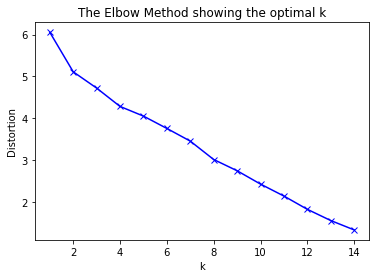

In [148]:
# determine k using elbow method

from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt

# k means determine k
distortions = []
K = range(1,15)
for k in K:
    kmeanModel = KMeans(init = "k-means++", n_clusters = k, n_init = 12)
    final_clustering = df_comp_top_grouped.drop('neighbourhood', 1) # neighbourhood in this dataset is a categorical variable
    kmeanModel.fit(final_clustering)
    distortions.append(sum(np.min(cdist(final_clustering, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / final_clustering.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

It is not so obvious, but I set k=3

Running k-means to cluster the neighborhoods into 3 clusters

In [149]:
# set number of clusters
clusterNum = 3
k_means = KMeans(init = "k-means++", n_clusters = clusterNum, n_init = 12)
final_clustering = df_comp_top_grouped.drop('neighbourhood', 1) # neighbourhood in this dataset is a categorical variable

# run k-means clustering
k_means.fit(final_clustering)

label = k_means.labels_

# check cluster labels generated for each row in the dataframe
print(label)

[1 1 1 1 2 2 2 0 1 0 1 1 2 1 2 2 2 2 0]


In [150]:
final_results = pd.DataFrame(k_means.cluster_centers_)
final_results.columns = final_clustering.columns
final_results.index = ['cluster_0','cluster_1', 'cluster_2']
final_results['total'] = final_results.sum(axis = 1)
final_results

,afghan restaurant,american restaurant,asian restaurant,bistro,brazilian restaurant,cantonese restaurant,caribbean restaurant,chinese restaurant,comfort food restaurant,cuban restaurant,dim sum restaurant,eastern european restaurant,ethiopian restaurant,falafel restaurant,fast food restaurant,filipino restaurant,french restaurant,gastropub,greek restaurant,hotpot restaurant,indian restaurant,indonesian restaurant,italian restaurant,japanese restaurant,korean restaurant,latin american restaurant,mediterranean restaurant,mexican restaurant,middle eastern restaurant,new american restaurant,persian restaurant,pizza place,portuguese restaurant,ramen restaurant,restaurant,seafood restaurant,south american restaurant,southern / soul food restaurant,spanish restaurant,steakhouse,sushi restaurant,taiwanese restaurant,tapas restaurant,thai restaurant,theme restaurant,turkish restaurant,vegetarian / vegan restaurant,vietnamese restaurant,total
cluster_0,0.333333,0.0,0.000,0.666667,0.000,0.000,0.333333,1.00,0.00,0.00,0.00,0.00,0.000,0.000,5.333333,0.000,0.000,0.000,0.666667,0.000,2.333333,0.000,0.333333,0.000,0.000,0.000,0.000,0.333333,0.00,0.000,0.000,3.333333,0.000,0.000,1.333333,0.00,0.000,0.000,0.000,0.333333,0.333333,0.000,0.00,0.333333,0.00,0.0,0.000,0.666667,17.666667
cluster_1,0.000000,1.0,0.500,0.250000,0.125,0.125,0.625000,0.25,0.25,0.25,0.25,0.25,0.125,0.000,0.250000,0.250,0.250,1.125,0.125000,0.000,1.375000,0.125,5.375000,2.250,0.625,0.125,0.375,0.750000,1.25,0.500,0.125,2.125000,0.125,0.375,4.250000,0.75,0.125,0.125,0.125,0.250000,1.500000,0.000,0.25,1.500000,0.25,0.0,0.875,0.375000,31.875000
cluster_2,0.125000,0.5,0.125,0.000000,0.000,0.000,0.500000,1.75,0.00,0.00,0.00,0.00,0.000,0.125,1.000000,0.125,0.375,0.125,0.375000,0.125,0.125000,0.125,0.750000,1.375,0.500,0.250,0.500,0.250000,0.50,0.125,0.125,1.500000,0.125,0.250,1.125000,0.75,0.000,0.000,0.000,0.500000,0.625000,0.125,0.00,0.750000,0.00,0.5,0.125,0.875000,17.125000


In [151]:
final_results_merged = pd.DataFrame(df_comp_top_grouped['neighbourhood'])
final_results_merged = final_results_merged.assign(cluster_labels = label)
final_results_merged

,neighbourhood,cluster_labels
0,Annex,1
1,Banbury-Don Mills,1
2,Church-Yonge Corridor,1
3,Dovercourt-Wallace Emerson-Junction,1
4,Downsview-Roding-CFB,2
5,Islington-City Centre West,2
6,L'Amoreaux,2
7,Malvern,0
8,Mimico (includes Humber Bay Shores),1
9,Mount Olive-Silverstone-Jamestown,0


Getting the final dataset of top selected neighbourhoods distributing by clusters + indicating the percentage of target population for the future examining

In [152]:
df_final_clust = pd.merge(final_results_merged, df_top, left_on='neighbourhood', right_on='neighbourhood', how='inner')
df_final_clust = pd.merge(df_final_clust, comp_qty, left_on='neighbourhood', right_on='neighbourhood', how='inner')
df_final_clust['p_target_population'] = df_final_clust['target_population'] / df_final_clust['population'] * 100
df_final_clust['p_target_population'] = pd.Series(["{0:.2f}%".format(val) for val in df_final_clust['p_target_population']], index = df_final_clust.index)

df_final_clust

,neighbourhood,cluster_labels,cdn,borough,population,target_population,after_tax_income,area_name,longitude,latitude,total_score,competitiors,p_target_population
0,Annex,1,95,Old City of Toronto,29177,10690,2053142,Annex (95),-79.404001,43.671585,2.19,26,36.64%
1,Banbury-Don Mills,1,42,North York,26918,9420,1158599,Banbury-Don Mills (42),-79.349718,43.737657,1.71,36,35.00%
2,Church-Yonge Corridor,1,75,Old City of Toronto,28349,13240,1221015,Church-Yonge Corridor (75),-79.379017,43.659649,2.05,28,46.70%
3,Dovercourt-Wallace Emerson-Junction,1,93,Old City of Toronto,34631,15360,1037114,Dovercourt-Wallace Emerson-Junction (93),-79.438541,43.665677,2.27,31,44.35%
4,Downsview-Roding-CFB,2,26,North York,34659,12825,824881,Downsview-Roding-CFB (26),-79.490497,43.733292,2.01,17,37.00%
5,Islington-City Centre West,2,14,Etobicoke,38084,16655,1536690,Islington-City Centre West (14),-79.543317,43.633463,2.63,9,43.73%
6,L'Amoreaux,2,117,Scarborough,44919,14135,989212,L'Amoreaux (117),-79.314084,43.795716,2.38,25,31.47%
7,Malvern,0,132,Scarborough,45086,14655,888593,Malvern (132),-79.222517,43.803658,2.39,19,32.50%
8,Mimico (includes Humber Bay Shores),1,17,Etobicoke,26541,14145,1275825,Mimico (includes Humber Bay Shores) (17),-79.500137,43.615924,2.10,37,53.29%
9,Mount Olive-Silverstone-Jamestown,0,2,Etobicoke,32788,11225,575316,Mount Olive-Silverstone-Jamestown (2),-79.587259,43.746868,1.75,15,34.24%


Visualizing the resulting clusters with all competitors in selected neighbourhoods

In [153]:
# create map with center 43.738228, -79.364096
map_cluster = folium.Map(location=[43.738228, -79.364096], zoom_start=11.2, tiles = 'Stamen Toner')

# create a numpy array of length 5 and has linear spacing from the minium total score to the maximum total score
threshold_scale = np.linspace(df_final['total_score'].min(),
                              df_final['total_score'].max(),
                              5, dtype=float)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum score

# let Folium determine the scale.
folium.Choropleth(
    geo_data=toronto_geo,
    data=df_final,
    columns=['area_name', 'total_score'],
    key_on='feature.properties.AREA_NAME',
    threshold_scale=threshold_scale,
    fill_color='Greys', 
    fill_opacity=0.9, 
    line_opacity=0.6,
    legend_name='Toronto Neighbourhood Scores',
    reset=True
).add_to(map_cluster)

# add markers to map
for lat, lng, venue, category in zip(df_comp_top['venue_latitude'], df_comp_top['venue_longitude'], df_comp_top['venue'], df_comp_top['venue_category']):
        label = '{}, {}'.format(category, venue)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=0.1,
            popup=label,
            color='orange',
            fill=True,
            fill_color='#FF0000',
            fill_opacity=0.9).add_to(map_cluster)

# set color scheme for the clusters
x = np.arange(clusterNum)
ys = [i+x+(i*x)**2 for i in range(clusterNum)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, neighbourhood, cluster, total_score in zip(df_final_clust['latitude'], df_final_clust['longitude'], df_final_clust['neighbourhood'], df_final_clust['cluster_labels'], df_final_clust['total_score']):
    label = '{}, Cluster: {}, Total Score: {}'.format(neighbourhood, cluster, total_score)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=7,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.2).add_to(map_cluster)
          
       
map_cluster

Let's examine the resulting clusters

In [154]:
df_final_clust_exem = pd.merge(df_final_clust, comp_venues_sorted, left_on='neighbourhood', right_on='neighbourhood', how='inner').sort_values(by=['cluster_labels'])
df_final_clust_exem.drop(['cdn', 'borough', 'population', 'target_population', 'after_tax_income', 'area_name', 'longitude', 'latitude'], axis=1, inplace=True)
df_final_clust_exem

,neighbourhood,cluster_labels,total_score,competitiors,p_target_population,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue
9,Mount Olive-Silverstone-Jamestown,0,1.75,15,34.24%,indian restaurant,fast food restaurant,pizza place
7,Malvern,0,2.39,19,32.50%,fast food restaurant,pizza place,restaurant
18,Woburn,0,2.89,19,33.45%,fast food restaurant,indian restaurant,pizza place
3,Dovercourt-Wallace Emerson-Junction,1,2.27,31,44.35%,italian restaurant,indian restaurant,gastropub
1,Banbury-Don Mills,1,1.71,36,35.00%,restaurant,japanese restaurant,pizza place
8,Mimico (includes Humber Bay Shores),1,2.10,37,53.29%,restaurant,sushi restaurant,italian restaurant
10,Mount Pleasant West,1,2.02,34,45.82%,italian restaurant,japanese restaurant,sushi restaurant
11,Niagara,1,2.25,32,77.37%,italian restaurant,seafood restaurant,pizza place
13,Rosedale-Moore Park,1,1.81,31,32.14%,italian restaurant,restaurant,japanese restaurant
2,Church-Yonge Corridor,1,2.05,28,46.70%,gastropub,japanese restaurant,restaurant


Cluster 0

In [155]:
cluster0 = df_final_clust_exem.loc[df_final_clust_exem['cluster_labels'] == 0]
print(cluster0.describe())
cluster0.describe(include=['object', 'bool'])

       cluster_labels  total_score  competitiors
count             3.0     3.000000      3.000000
mean              0.0     2.343333     17.666667
std               0.0     0.571431      2.309401
min               0.0     1.750000     15.000000
25%               0.0     2.070000     17.000000
50%               0.0     2.390000     19.000000
75%               0.0     2.640000     19.000000
max               0.0     2.890000     19.000000


,neighbourhood,p_target_population,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue
count,3,3,3,3,3
unique,3,3,2,3,2
top,Woburn,34.24%,fast food restaurant,pizza place,pizza place
freq,1,1,2,1,2


Cluster 1

In [156]:
cluster1 = df_final_clust_exem.loc[df_final_clust_exem['cluster_labels'] == 1]
print(cluster1.describe())
cluster1.describe(include=['object', 'bool'])

       cluster_labels  total_score  competitiors
count             8.0     8.000000      8.000000
mean              1.0     2.050000     31.875000
std               0.0     0.201636      3.758324
min               1.0     1.710000     26.000000
25%               1.0     1.967500     30.250000
50%               1.0     2.075000     31.500000
75%               1.0     2.205000     34.500000
max               1.0     2.270000     37.000000


,neighbourhood,p_target_population,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue
count,8,8,8,8,8
unique,8,8,3,6,7
top,Banbury-Don Mills,32.14%,italian restaurant,japanese restaurant,pizza place
freq,1,1,4,3,2


In [157]:
cluster2 = df_final_clust_exem.loc[df_final_clust_exem['cluster_labels'] == 2]
print(cluster2.describe())
cluster2.describe(include=['object', 'bool'])

       cluster_labels  total_score  competitiors
count             8.0     8.000000      8.000000
mean              2.0     2.515000     17.125000
std               0.0     0.849571      6.311837
min               2.0     1.830000      9.000000
25%               2.0     1.972500     12.250000
50%               2.0     2.205000     17.500000
75%               2.0     2.730000     20.500000
max               2.0     4.350000     26.000000


,neighbourhood,p_target_population,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue
count,8,8,8,8,8
unique,8,8,7,6,5
top,South Riverdale,31.47%,japanese restaurant,fast food restaurant,pizza place
freq,1,1,2,2,3


This concludes our analysis. We have found the top 19 neighbourhoods rated by scores, calculated according to the initial criteria, and examined the competitive environment.


## Results and Discussion <a name="results"></a>

The first look at the map shows us that there are significant numbers of restaurants different types and cuisines in the southern part of Toronto, close to central streets, and to the shore of Lake Ontario.

Based on the found and presented results, the following recommendations can be made:
* the main recommendation for the prospective investor would be to focus on neighbourhoods from cluster 2, as this area has good average scores and low density of competitors.
* the main neighborhood recommendation would be for **"Islington-City Centre West"**. With a score of 2.63, this neighbourhood is a commercial and residential area in Etobicoke, Toronto, Ontario, Canada. One of four central business districts outside Downtown Toronto with good perspectives to catch numerous of white-collars in lunchtime and a good number of locals for supper.
* the second and the third places go to **"Woburn"** 2.89 and **"Malvern"** 2.39 from cluster 0, both are with an average density of competition and with no Italian cuisine in the top common venues across the entire neighbourhood.


## Conclusion <a name="conclusion"></a>

The final decision on optimal restaurant location will be made by the future investor based on the recommendations given in this analysis and also on specific characteristics of neighborhoods in every recommended area, taking into consideration additional factors like real estate availability, prices, etc.

Also, before starting spending money on renting and renovating the facility, don't forget about the outdated data used in this analysis, such as information about the venues from API Foursquare and the 2016 Census Data. However, the methodology and main calculations will allow you to make the right decision when applying the updated initial data.